# 1. Defining Paths

In [339]:
from pathlib import Path
import os
import sys
sys.path.append(str(Path(os.getcwd()).resolve().parent))

PROJECT_PATH = Path(os.getcwd()).resolve().parent
DATA_DIR = PROJECT_PATH / 'data'
CAPUCHINBIRD_DIR = DATA_DIR / 'Parsed_Capuchinbird_Clips'
NOT_CAPUCHINBIRD_DIR = DATA_DIR / 'Parsed_Not_Capuchinbird_Clips'

# 2. Loading DataFrames

In [340]:
from scripts.data_loading import load_audio_filepaths

CAPUCHINBIRD_DF = load_audio_filepaths(CAPUCHINBIRD_DIR)
NOT_CAPUCHINBIRD_DF = load_audio_filepaths(NOT_CAPUCHINBIRD_DIR)

In [341]:
CAPUCHINBIRD_DF

,filename,filepath
0,XC114131-0.wav,C:\Users\miki0\Desktop\Projects\Audio\Capuchin...
1,XC114131-1.wav,C:\Users\miki0\Desktop\Projects\Audio\Capuchin...
2,XC114131-2.wav,C:\Users\miki0\Desktop\Projects\Audio\Capuchin...
3,XC114131-3.wav,C:\Users\miki0\Desktop\Projects\Audio\Capuchin...
4,XC114131-4.wav,C:\Users\miki0\Desktop\Projects\Audio\Capuchin...
...,...,...
212,XC9221-1.wav,C:\Users\miki0\Desktop\Projects\Audio\Capuchin...
213,XC9221-2.wav,C:\Users\miki0\Desktop\Projects\Audio\Capuchin...
214,XC98557-0.wav,C:\Users\miki0\Desktop\Projects\Audio\Capuchin...
215,XC98557-1.wav,C:\Users\miki0\Desktop\Projects\Audio\Capuchin...


# 3. Checking balance between Capuchinbird and Not Capuchinbrid Datasets

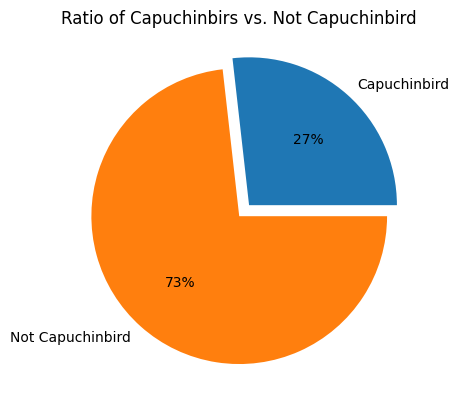

In [342]:
import matplotlib.pyplot as plt

plt.pie(
    (len(CAPUCHINBIRD_DF), len(NOT_CAPUCHINBIRD_DF)),
    labels=['Capuchinbird', 'Not Capuchinbird'],
    autopct='%0.f%%',
    explode=(0.1, 0)
)

plt.title('Ratio of Capuchinbirs vs. Not Capuchinbird')
plt.show()

# 4. Plot One Sample from Capuchinbirg and Not Capuchinbird

## 4.1 Loading Audio Function

In [343]:
import librosa
import numpy as np

def load_wav_24k_mono(filepath: str) -> np.ndarray:
    wav, sr = librosa.load(filepath, sr=24000, mono=True)

    return wav

## 4.2 Selecing Samples

In [344]:
cap_file = CAPUCHINBIRD_DF.iloc[10]['filepath']
n_cap_file = NOT_CAPUCHINBIRD_DF.iloc[10]['filepath']

In [345]:
from IPython.display import Audio

print('CAPUCHINBIRD')
Audio(cap_file)

CAPUCHINBIRD


In [346]:
print('Not Capuchinbird')
Audio(n_cap_file)

Not Capuchinbird


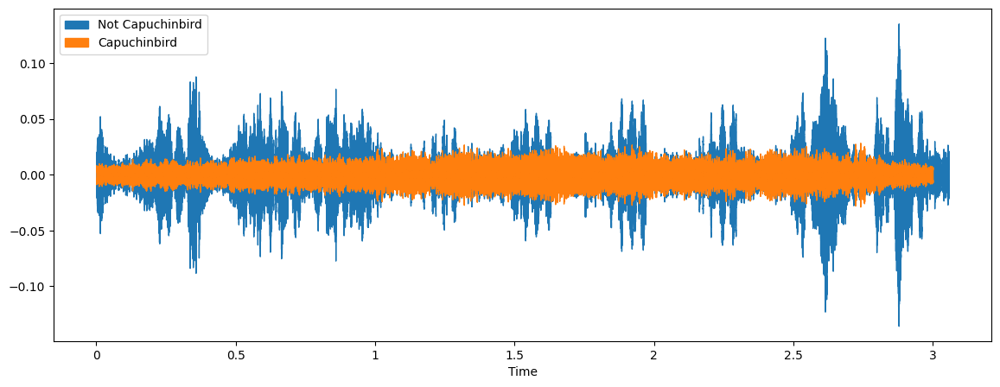

In [347]:
cap_wav = load_wav_24k_mono(cap_file)
n_cap_wav = load_wav_24k_mono(n_cap_file)

plt.figure(figsize=(14, 5))
librosa.display.waveshow(n_cap_wav, sr=24e3, label='Not Capuchinbird')
librosa.display.waveshow(cap_wav, sr=24e3, label='Capuchinbird')
plt.legend()
plt.show()

# 5. Determine Average Length of a Capuchin Call

## 5.1 Calculating Average Wave Cycle Length

In [348]:
def cycle_length(filepath: str) -> int:
    wav = load_wav_24k_mono(filepath)

    return wav.shape[0]

In [349]:
CAPUCHINBIRD_DF['n_samples'] = CAPUCHINBIRD_DF['filepath'].apply(cycle_length)
CAPUCHINBIRD_DF

,filename,filepath,n_samples
0,XC114131-0.wav,C:\Users\miki0\Desktop\Projects\Audio\Capuchin...,60000
1,XC114131-1.wav,C:\Users\miki0\Desktop\Projects\Audio\Capuchin...,72000
2,XC114131-2.wav,C:\Users\miki0\Desktop\Projects\Audio\Capuchin...,84000
3,XC114131-3.wav,C:\Users\miki0\Desktop\Projects\Audio\Capuchin...,72000
4,XC114131-4.wav,C:\Users\miki0\Desktop\Projects\Audio\Capuchin...,84000
...,...,...,...
212,XC9221-1.wav,C:\Users\miki0\Desktop\Projects\Audio\Capuchin...,96001
213,XC9221-2.wav,C:\Users\miki0\Desktop\Projects\Audio\Capuchin...,84001
214,XC98557-0.wav,C:\Users\miki0\Desktop\Projects\Audio\Capuchin...,96001
215,XC98557-1.wav,C:\Users\miki0\Desktop\Projects\Audio\Capuchin...,96001


In [350]:
CAPUCHINBIRD_DF['n_samples'].describe()

count       217.000000
mean      81235.414747
std       12287.795046
min       48000.000000
25%       72000.000000
50%       84000.000000
75%       84001.000000
max      120001.000000
Name: n_samples, dtype: float64

In [351]:
N_SAMPLES = 72000

def fix_audio_length(wav: np.ndarray) -> np.ndarray:
    wav = wav[:N_SAMPLES]
    zero_padding = np.zeros(N_SAMPLES - wav.shape[0], dtype=np.float32)
    wav = np.concatenate((wav, zero_padding))

    return wav

# 6. Visualize Spectograms

In [352]:
def get_spectogram(wav: np.ndarray, expand_dims: bool=False) -> np.ndarray:
    spectogram = librosa.stft(wav, n_fft=512, hop_length=128)
    if expand_dims:
        spectogram = np.expand_dims(spectogram, axis=2)
    
    return spectogram

In [353]:
random_idx = np.random.choice(CAPUCHINBIRD_DF.index, 6, replace=False)
capuchin_10_samples = CAPUCHINBIRD_DF.iloc[random_idx]
random_idx = np.random.choice(NOT_CAPUCHINBIRD_DF.index, 6, replace=False)
not_capuchin_10_samples = NOT_CAPUCHINBIRD_DF.iloc[random_idx]

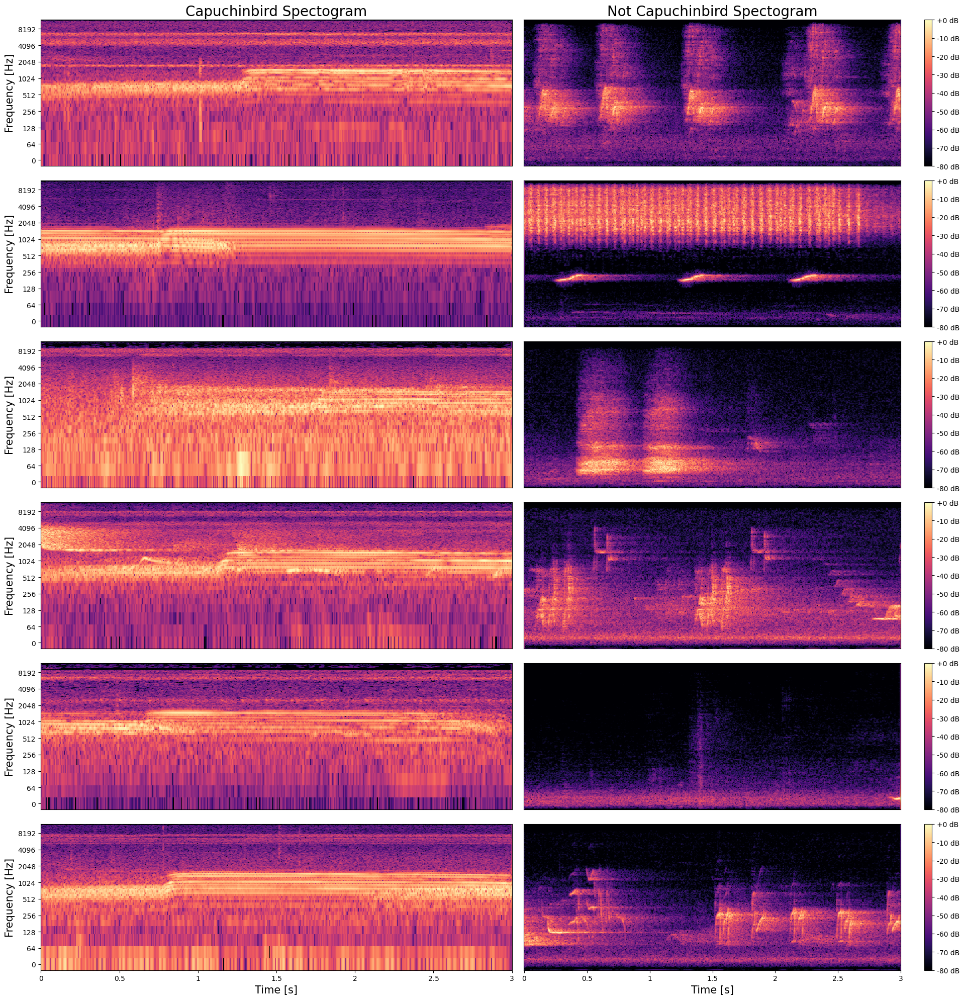

In [354]:
nrows = 6
ncols = 2
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 20))
axes = axes.flatten()

for idx, (capuchin_filepath, not_capuchin_filepath) in enumerate(zip(capuchin_10_samples['filepath'], not_capuchin_10_samples['filepath'])):
    wav_cap = load_wav_24k_mono(capuchin_filepath)
    wav_not = load_wav_24k_mono(not_capuchin_filepath)

    wav_cap = fix_audio_length(wav_cap)
    wav_not = fix_audio_length(wav_not)

    spec_cap = np.abs(get_spectogram(wav_cap))
    spec_not = np.abs(get_spectogram(wav_not))

    spec_cap_db = librosa.amplitude_to_db(spec_cap, ref=np.max)
    spec_not_db = librosa.amplitude_to_db(spec_not, ref=np.max)

    idx_cap = 2 * idx
    idx_not = (2 * idx) + 1

    if idx != nrows-1:
        librosa.display.specshow(data=spec_cap_db, sr=24000, y_axis='log', hop_length=128, ax=axes[idx_cap])
        img = librosa.display.specshow(data=spec_not_db, sr=24000, hop_length=128, ax=axes[idx_not])

        plt.colorbar(img, format='%+2.0f dB', ax=axes[idx_not])
        axes[idx_cap].set_ylabel('Frequency [Hz]', fontsize=15)

    if idx == 0:
        axes[idx_cap].set_title('Capuchinbird Spectogram', fontsize=20)
        axes[idx_not].set_title('Not Capuchinbird Spectogram', fontsize=20)

    if idx == nrows-1:
        librosa.display.specshow(data=spec_cap_db, y_axis='log', x_axis='time', sr=24000, hop_length=128, ax=axes[idx_cap])
        img = librosa.display.specshow(data=spec_not_db, x_axis='time', sr=24000, hop_length=128, ax=axes[idx_not])

        plt.colorbar(img, format='%+2.0f dB', ax=axes[idx_not])
        axes[idx_cap].set_ylabel('Frequency [Hz]', fontsize=15)

        axes[idx_cap].set_xlabel('Time [s]', fontsize=15)
        axes[idx_not].set_xlabel('Time [s]', fontsize=15)


plt.tight_layout()
plt.show()

# 7. Visualize Mel-Spectograms

In [355]:
def get_mel_spectogram(wav: np.ndarray, expand_dims: bool=False) -> np.ndarray:
    mel_spectogram = librosa.feature.melspectrogram(y=wav, sr=24000, n_fft=512, hop_length=128, n_mels=128)
    if expand_dims:
        mel_spectogram = np.expand_dims(mel_spectogram, axis=2)
    
    return mel_spectogram

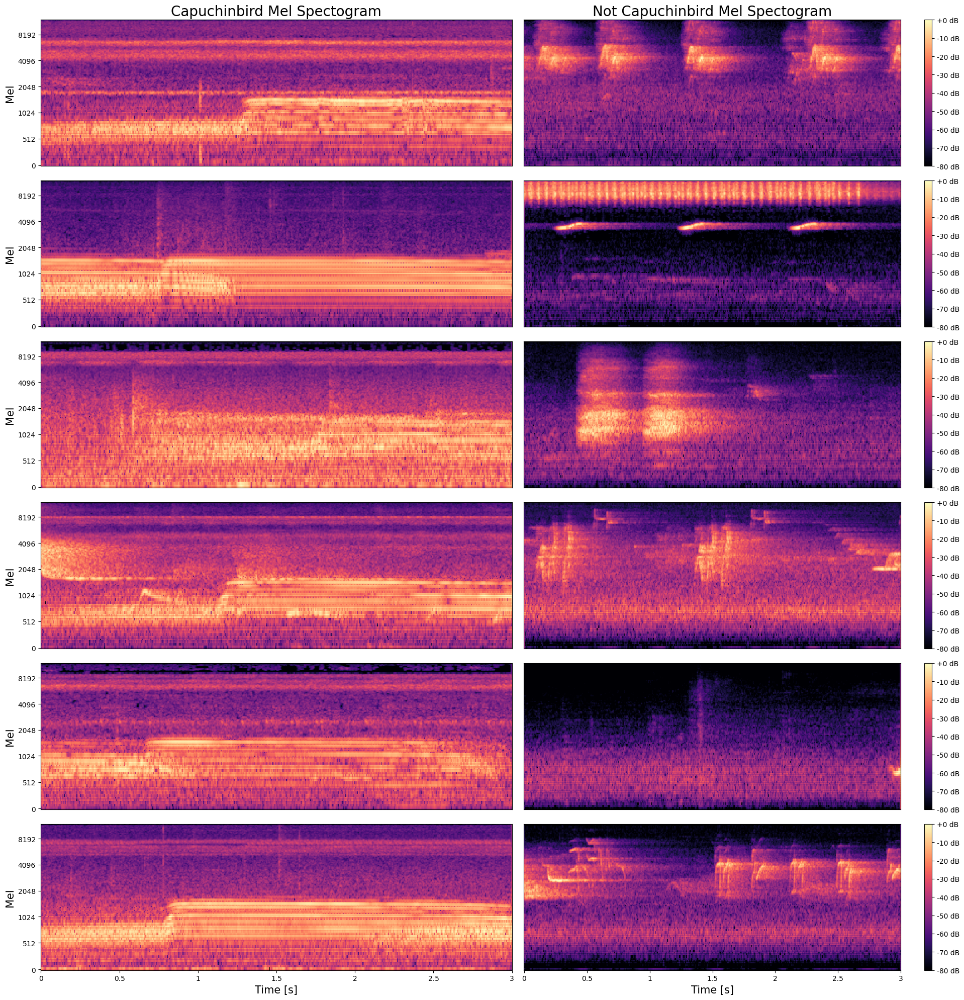

In [356]:
nrows = 6
ncols = 2
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 20))
axes = axes.flatten()

for idx, (capuchin_filepath, not_capuchin_filepath) in enumerate(zip(capuchin_10_samples['filepath'], not_capuchin_10_samples['filepath'])):
    wav_cap = load_wav_24k_mono(capuchin_filepath)
    wav_not = load_wav_24k_mono(not_capuchin_filepath)

    wav_cap = fix_audio_length(wav_cap)
    wav_not = fix_audio_length(wav_not)

    mel_spec_cap = get_mel_spectogram(wav_cap)
    mel_spec_not = get_mel_spectogram(wav_not)

    mel_spec_cap_db = librosa.power_to_db(mel_spec_cap, ref=np.max)
    mel_spec_not_db = librosa.power_to_db(mel_spec_not, ref=np.max)

    idx_cap = 2 * idx
    idx_not = (2 * idx) + 1

    if idx != nrows-1:
        librosa.display.specshow(data=mel_spec_cap_db, sr=24000, y_axis='mel', hop_length=128, ax=axes[idx_cap])
        img = librosa.display.specshow(data=mel_spec_not_db, sr=24000, hop_length=128, ax=axes[idx_not])

        plt.colorbar(img, format='%+2.0f dB', ax=axes[idx_not])
        axes[idx_cap].set_ylabel('Mel', fontsize=15)

    if idx == 0:
        axes[idx_cap].set_title('Capuchinbird Mel Spectogram', fontsize=20)
        axes[idx_not].set_title('Not Capuchinbird Mel Spectogram', fontsize=20)

    if idx == nrows-1:
        librosa.display.specshow(data=mel_spec_cap_db, y_axis='mel', x_axis='time', sr=24000, hop_length=128, ax=axes[idx_cap])
        img = librosa.display.specshow(data=mel_spec_not_db, x_axis='time', sr=24000, hop_length=128, ax=axes[idx_not])

        plt.colorbar(img, format='%+2.0f dB', ax=axes[idx_not])
        axes[idx_cap].set_ylabel('Mel', fontsize=15)

        axes[idx_cap].set_xlabel('Time [s]', fontsize=15)
        axes[idx_not].set_xlabel('Time [s]', fontsize=15)


plt.tight_layout()
plt.show()

# 8. Visualize MFCC

In [357]:
def get_MFCC(wav: np.ndarray, n_mfcc: int, expand_dims: bool=False) -> np.ndarray:
    mfcc = librosa.feature.mfcc(y=wav, sr=24000, n_fft=512, hop_length=128, n_mfcc=n_mfcc)
    if expand_dims:
        mfcc = np.expand_dims(mfcc, axis=2)
    
    return mfcc

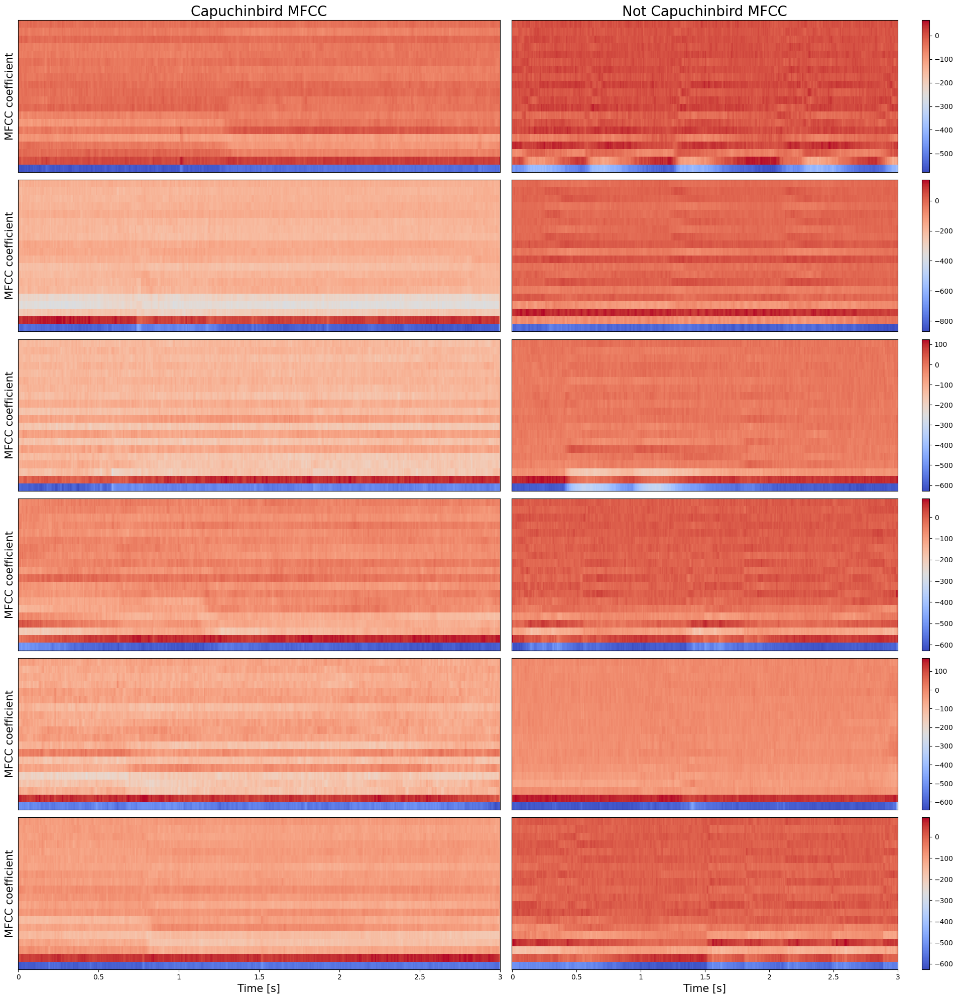

In [358]:
nrows = 6
ncols = 2
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 20))
axes = axes.flatten()

for idx, (capuchin_filepath, not_capuchin_filepath) in enumerate(zip(capuchin_10_samples['filepath'], not_capuchin_10_samples['filepath'])):
    wav_cap = load_wav_24k_mono(capuchin_filepath)
    wav_not = load_wav_24k_mono(not_capuchin_filepath)

    wav_cap = fix_audio_length(wav_cap)
    wav_not = fix_audio_length(wav_not)

    MFCC_cap = get_MFCC(wav_cap, n_mfcc=20)
    MFCC_not = get_MFCC(wav_not, n_mfcc=20)

    idx_cap = 2 * idx
    idx_not = (2 * idx) + 1

    if idx != nrows-1:
        librosa.display.specshow(data=MFCC_cap, sr=24000, y_axis=None, hop_length=128, ax=axes[idx_cap])
        img = librosa.display.specshow(data=MFCC_not, sr=24000, hop_length=128, ax=axes[idx_not])

        plt.colorbar(img, ax=axes[idx_not])
        axes[idx_cap].set_ylabel('MFCC coefficient', fontsize=15)

    if idx == 0:
        axes[idx_cap].set_title('Capuchinbird MFCC', fontsize=20)
        axes[idx_not].set_title('Not Capuchinbird MFCC', fontsize=20)

    if idx == nrows-1:
        librosa.display.specshow(data=MFCC_cap, y_axis=None, x_axis='time', sr=24000, hop_length=128, ax=axes[idx_cap])
        img = librosa.display.specshow(data=MFCC_not, x_axis='time', sr=24000, hop_length=128, ax=axes[idx_not])

        plt.colorbar(img, ax=axes[idx_not])
        axes[idx_cap].set_ylabel('MFCC coefficient', fontsize=15)

        axes[idx_cap].set_xlabel('Time [s]', fontsize=15)
        axes[idx_not].set_xlabel('Time [s]', fontsize=15)


plt.tight_layout()
plt.show()

# 9. Merging Datasets and adding Labels

In [359]:
import pandas as pd

data = pd.concat(
    (
        CAPUCHINBIRD_DF.assign(label=1), 
        NOT_CAPUCHINBIRD_DF.assign(label=0)
    ), 
    axis=0
)[['filepath', 'label']]

In [360]:
data

,filepath,label
0,C:\Users\miki0\Desktop\Projects\Audio\Capuchin...,1
1,C:\Users\miki0\Desktop\Projects\Audio\Capuchin...,1
2,C:\Users\miki0\Desktop\Projects\Audio\Capuchin...,1
3,C:\Users\miki0\Desktop\Projects\Audio\Capuchin...,1
4,C:\Users\miki0\Desktop\Projects\Audio\Capuchin...,1
...,...,...
588,C:\Users\miki0\Desktop\Projects\Audio\Capuchin...,0
589,C:\Users\miki0\Desktop\Projects\Audio\Capuchin...,0
590,C:\Users\miki0\Desktop\Projects\Audio\Capuchin...,0
591,C:\Users\miki0\Desktop\Projects\Audio\Capuchin...,0


# 10. Preparing Data for ML Models

## 10.1 Extracting Standard Deviation (std) and Mean for each Mel

In [361]:
mfcc_features = []
N_MFCC = 20

for filepath in data['filepath']:
    wav = load_wav_24k_mono(filepath)
    wav = fix_audio_length(wav)
    mfcc = get_MFCC(wav, n_mfcc=N_MFCC)
    mfcc_mean = mfcc.mean(axis=1)
    mfcc_std = mfcc.std(axis=1)
    feature_vector = np.concatenate([mfcc_mean, mfcc_std])
    mfcc_features.append(feature_vector)

mfcc_features = np.array(mfcc_features)
mfcc_features.shape


(810, 40)

In [362]:
feature_names = [f'mfcc_{n+1}_mean' for n in range(N_MFCC)] + [f'mfcc_{n+1}_std' for n in range(N_MFCC)]

df_features = pd.concat(
    (
        pd.DataFrame(mfcc_features, columns=feature_names),
        data['label'].reset_index(drop=True)
    ),
    axis=1
)
df_features

,mfcc_1_mean,mfcc_2_mean,mfcc_3_mean,mfcc_4_mean,mfcc_5_mean,mfcc_6_mean,mfcc_7_mean,mfcc_8_mean,mfcc_9_mean,mfcc_10_mean,...,mfcc_12_std,mfcc_13_std,mfcc_14_std,mfcc_15_std,mfcc_16_std,mfcc_17_std,mfcc_18_std,mfcc_19_std,mfcc_20_std,label
0,-606.744385,64.156319,0.616126,-29.570839,-69.557869,20.485350,-11.222611,-9.279613,8.124854,4.578422,...,9.057345,7.974447,9.712642,6.227230,6.865395,5.995736,9.532133,8.937919,6.409004,1
1,-532.005310,70.882698,0.676590,-34.821465,-84.786514,27.581680,-7.783874,-4.975824,16.344276,5.709740,...,7.873626,7.604167,8.232334,6.193562,7.594326,6.837880,6.583007,7.026431,6.654953,1
2,-538.898987,66.199310,5.687092,-24.744280,-75.520172,19.895966,-18.913483,-9.552833,8.509912,4.928029,...,8.080588,8.603658,8.841310,6.917812,8.612975,7.987647,7.479937,8.404984,6.331627,1
3,-533.652161,63.924229,-5.916528,-27.779629,-75.414024,22.504999,-12.269957,-7.911198,15.199009,7.725718,...,7.250030,8.363427,7.935119,7.928361,8.312006,7.640768,6.538879,9.528507,5.743876,1
4,-544.055725,64.157524,-3.954026,-22.826408,-72.264740,19.644527,-10.636079,-16.959530,19.148615,12.448587,...,7.436962,10.110715,8.294903,7.065190,9.732930,7.887137,6.715928,7.163429,6.465579,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
805,-552.739014,94.244217,6.407949,-40.441750,-44.119221,-32.080196,-14.314820,-1.995832,-3.553714,-6.444102,...,8.385654,19.758728,13.873455,10.775575,7.573173,6.122296,7.803608,10.121932,10.159286,0
806,-523.200378,97.835159,-11.307199,-51.912376,-43.392372,-26.376532,-5.485725,3.997742,-3.351740,-7.580984,...,13.086874,17.420731,8.626588,12.163469,7.171203,6.673469,9.072167,8.252129,14.194366,0
807,-532.241516,105.430107,-7.140385,-58.960751,-50.850361,-30.547222,-12.229996,-0.506433,-1.050295,-1.459418,...,8.490207,20.854925,14.795438,11.496551,8.526041,5.482925,8.877973,10.682450,10.332726,0
808,-604.894531,136.930847,-22.233337,-43.130596,-35.883175,-25.101929,-14.994522,-8.345757,-13.839084,-12.800136,...,7.884962,7.135747,6.622206,6.792380,7.749235,6.820463,6.667698,7.501879,6.786647,0


## 10.2 Matrix Coefficients Heatmap

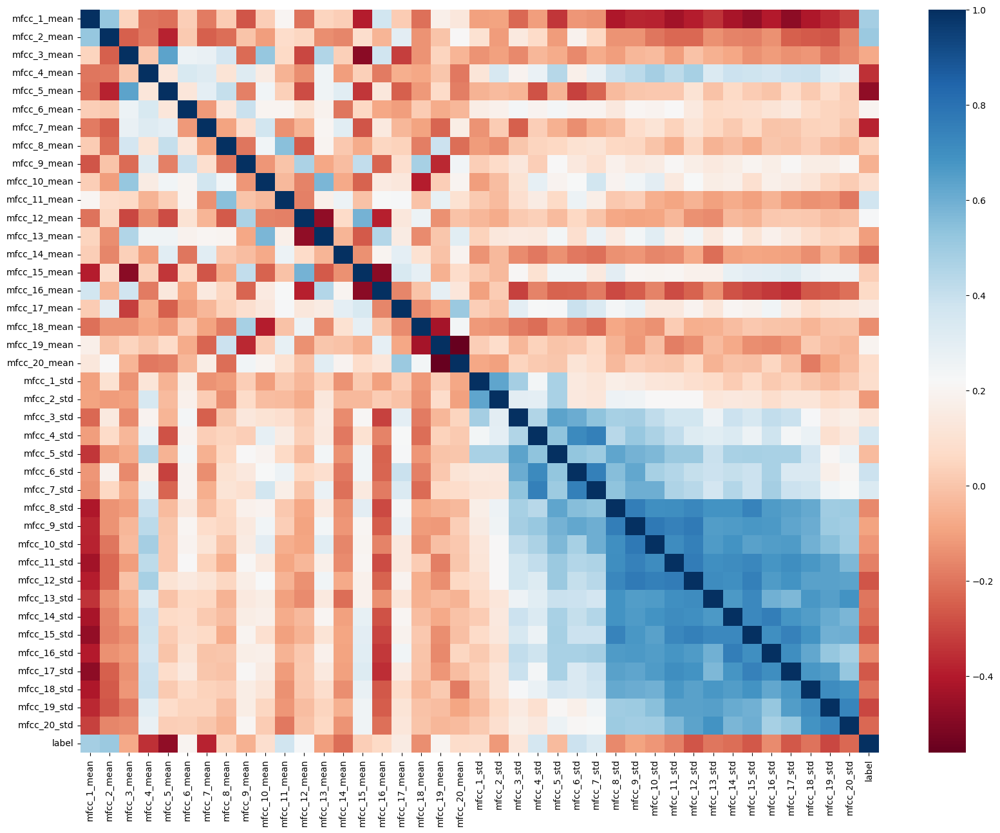

In [363]:
import seaborn as sns

m_coeff = df_features.corr()

plt.figure(figsize=(20, 15))
sns.heatmap(m_coeff, cmap='RdBu', vmin=m_coeff.describe().loc['min'].min(), vmax=m_coeff.describe().loc['max'].max())

plt.show()

In [364]:
m_coeff_sort = m_coeff['label'].abs().sort_values(ascending=False)
m_coeff_sort

label           1.000000
mfcc_2_mean     0.507619
mfcc_1_mean     0.485925
mfcc_5_mean     0.470983
mfcc_6_std      0.388275
mfcc_7_mean     0.381889
mfcc_11_mean    0.374014
mfcc_4_std      0.354495
mfcc_4_mean     0.352280
mfcc_7_std      0.331834
mfcc_19_std     0.300606
mfcc_12_std     0.271354
mfcc_15_std     0.267959
mfcc_17_std     0.266894
mfcc_20_std     0.230760
mfcc_12_mean    0.227014
mfcc_14_std     0.217261
mfcc_14_mean    0.216981
mfcc_18_std     0.206401
mfcc_19_mean    0.200816
mfcc_13_std     0.199485
mfcc_6_mean     0.199344
mfcc_11_std     0.173239
mfcc_8_std      0.155509
mfcc_17_mean    0.152829
mfcc_16_std     0.147321
mfcc_18_mean    0.142100
mfcc_3_std      0.125576
mfcc_10_std     0.121977
mfcc_2_std      0.117683
mfcc_13_mean    0.104758
mfcc_9_std      0.096935
mfcc_10_mean    0.086139
mfcc_1_std      0.081636
mfcc_20_mean    0.079179
mfcc_3_mean     0.075086
mfcc_16_mean    0.063890
mfcc_9_mean     0.055970
mfcc_8_mean     0.047319
mfcc_5_std      0.027230


## 10.3 Selecting 10, 20 and 30 Features with Highest Coefficient Values and Test on Basic Models

In [402]:
highest_10_features = m_coeff_sort.head(11).index
highest_20_features = m_coeff_sort.head(21).index
highest_30_features = m_coeff_sort.head(31).index
highest_10_features

Index(['label', 'mfcc_2_mean', 'mfcc_1_mean', 'mfcc_5_mean', 'mfcc_6_std',
       'mfcc_7_mean', 'mfcc_11_mean', 'mfcc_4_std', 'mfcc_4_mean',
       'mfcc_7_std', 'mfcc_19_std'],
      dtype='object')

### 10.4 Splitting Data into Train and Test Sets Function

In [403]:
from sklearn.model_selection import train_test_split
from typing import Tuple

def split_data(data_frame: pd.DataFrame, feature_names: pd.Index) -> Tuple[np.ndarray, np.ndarray, np.ndarray, np.ndarray]:
    X = data_frame[feature_names.drop('label')]
    y = data_frame['label']

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

    return X_train, X_test, y_train, y_test

### 10.5 Check Basic Models

In [409]:
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

def check_basic_models(data_frame, feature_names):
    print(f'Testing models on {feature_names.drop("label")}')
    X_train, X_test, y_train, y_test = split_data(data_frame, feature_names)

    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # SVM
    svm = SVC(kernel='rbf', random_state=42)
    svm.fit(X_train_scaled, y_train)
    y_preds = svm.predict(X_test_scaled)

    svm_report = classification_report(y_test, y_preds, output_dict=True)

    # Random Forest
    rf = RandomForestClassifier(n_estimators=100, random_state=42)
    rf.fit(X_train, y_train)
    y_preds = rf.predict(X_test)

    rf_report = classification_report(y_test, y_preds, output_dict=True)

    # LogisticRegression
    lr = LogisticRegression(max_iter=1000, random_state=42)
    lr.fit(X_train_scaled, y_train)
    y_preds = lr.predict(X_test_scaled)

    lr_report = classification_report(y_test, y_preds, output_dict=True)

    # Reports
    svm_report = pd.DataFrame(svm_report)
    rf_report = pd.DataFrame(rf_report)
    lr_report = pd.DataFrame(lr_report)

    svm_report['model'] = 'SVM'
    rf_report['model'] = 'RF'
    lr_report['model'] = 'LR'
    svm_report['feats'] = len(feature_names.drop("label"))
    rf_report['feats'] = len(feature_names.drop("label"))
    lr_report['feats'] = len(feature_names.drop("label"))

    all_results = pd.concat((svm_report, rf_report, lr_report))
    all_results = all_results.set_index(['model', 'feats'], append=True).reorder_levels(['model', 'feats', 0])
    
    return all_results

In [428]:
results_10_features = check_basic_models(df_features, highest_10_features)
results_20_features = check_basic_models(df_features, highest_20_features)
results_30_features = check_basic_models(df_features, highest_30_features)

all_results = pd.concat((results_10_features, results_20_features, results_30_features))
all_results.index = all_results.index.set_names(['model', 'feats', 'metric'])
all_results = all_results.reorder_levels(['model', 'feats', 'metric']).sort_index(level=['model', 'feats'])

all_results

Testing models on Index(['mfcc_2_mean', 'mfcc_1_mean', 'mfcc_5_mean', 'mfcc_6_std',
       'mfcc_7_mean', 'mfcc_11_mean', 'mfcc_4_std', 'mfcc_4_mean',
       'mfcc_7_std', 'mfcc_19_std'],
      dtype='object')
Testing models on Index(['mfcc_2_mean', 'mfcc_1_mean', 'mfcc_5_mean', 'mfcc_6_std',
       'mfcc_7_mean', 'mfcc_11_mean', 'mfcc_4_std', 'mfcc_4_mean',
       'mfcc_7_std', 'mfcc_19_std', 'mfcc_12_std', 'mfcc_15_std',
       'mfcc_17_std', 'mfcc_20_std', 'mfcc_12_mean', 'mfcc_14_std',
       'mfcc_14_mean', 'mfcc_18_std', 'mfcc_19_mean', 'mfcc_13_std'],
      dtype='object')
Testing models on Index(['mfcc_2_mean', 'mfcc_1_mean', 'mfcc_5_mean', 'mfcc_6_std',
       'mfcc_7_mean', 'mfcc_11_mean', 'mfcc_4_std', 'mfcc_4_mean',
       'mfcc_7_std', 'mfcc_19_std', 'mfcc_12_std', 'mfcc_15_std',
       'mfcc_17_std', 'mfcc_20_std', 'mfcc_12_mean', 'mfcc_14_std',
       'mfcc_14_mean', 'mfcc_18_std', 'mfcc_19_mean', 'mfcc_13_std',
       'mfcc_6_mean', 'mfcc_11_std', 'mfcc_8_std', 'mfcc_17

0          1  accuracy   macro avg  \
model feats metric                                                   
LR    10    f1-score     0.979079   0.941176  0.969136    0.960128   
            precision    0.975000   0.952381  0.969136    0.963690   
            recall       0.983193   0.930233  0.969136    0.956713   
            support    119.000000  43.000000  0.969136  162.000000   
      20    f1-score     0.991667   0.976190  0.987654    0.983929   
            precision    0.983471   1.000000  0.987654    0.991736   
            recall       1.000000   0.953488  0.987654    0.976744   
            support    119.000000  43.000000  0.987654  162.000000   
      30    f1-score     0.991667   0.976190  0.987654    0.983929   
            precision    0.983471   1.000000  0.987654    0.991736   
            recall       1.000000   0.953488  0.987654    0.976744   
            support    119.000000  43.000000  0.987654  162.000000   
RF    10    f1-score     0.987552   0.963855  0.981481    0.975704   
            precision    0.975410   1.000000  0.981481    0.987705   
            recall       1.000000   0.930233  0.981481    0.965116   
            support    119.000000  43.000000  0.981481  162.000000   
      20    f1-score     0.987552   0.963855  0.981481    0.975704   
            precision    0.975410   1.000000  0.981481    0.987705   
            recall       1.000000   0.930233  0.981481    0.965116   
            support    119.000000  43.000000  0.981481  162.000000   
      30    f1-score     0.987552   0.963855  0.981481    0.975704   
            precision    0.975410   1.000000  0.981481    0.987705   
            recall       1.000000   0.930233  0.981481    0.965116   
            support    119.000000  43.000000  0.981481  162.000000   
SVM   10    f1-score     0.991667   0.976190  0.987654    0.983929   
            precision    0.983471   1.000000  0.987654    0.991736   
            recall       1.000000   0.953488  0.987654    0.976744   
            support    119.000000  43.000000  0.987654  162.000000   
      20    f1-score     0.995816   0.988235  0.993827    0.992026   
            precision    0.991667   1.000000  0.993827    0.995833   
            recall       1.000000   0.976744  0.993827    0.988372   
            support    119.000000  43.000000  0.993827  162.000000   
      30    f1-score     0.995816   0.988235  0.993827    0.992026   
            precision    0.991667   1.000000  0.993827    0.995833   
            recall       1.000000   0.976744  0.993827    0.988372   
            support    119.000000  43.000000  0.993827  162.000000   

                       weighted avg  
model feats metric                   
LR    10    f1-score       0.969019  
            precision      0.968996  
            recall         0.969136  
            support      162.000000  
      20    f1-score       0.987559  
            precision      0.987858  
            recall         0.987654  
            support      162.000000  
      30    f1-score       0.987559  
            precision      0.987858  
            recall         0.987654  
            support      162.000000  
RF    10    f1-score       0.981262  
            precision      0.981937  
            recall         0.981481  
            support      162.000000  
      20    f1-score       0.981262  
            precision      0.981937  
            recall         0.981481  
            support      162.000000  
      30    f1-score       0.981262  
            precision      0.981937  
            recall         0.981481  
            support      162.000000  
SVM   10    f1-score       0.987559  
            precision      0.987858  
            recall         0.987654  
            support      162.000000  
      20    f1-score       0.993804  
            precision      0.993879  
            recall         0.993827  
            support      162.000000  
      30    f1-score       0.993804  
            precision      0.993879  
   

### UMAP Dimension Reduction with Specified n_components on all features

In [472]:
import umap

def check_basic_models_umap(data_frame, feature_names, umap_n_components):
    print(f'Testing models on umap_n_components {umap_n_components}')
    X_train, X_test, y_train, y_test = split_data(data_frame, feature_names)

    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    umap_model = umap.UMAP(n_components=umap_n_components)
    X_train_red = umap_model.fit_transform(X_train_scaled)
    X_test_red = umap_model.transform(X_test_scaled)

    # SVM
    svm = SVC(kernel='rbf', random_state=42)
    svm.fit(X_train_red, y_train)
    y_preds = svm.predict(X_test_red)

    svm_report = classification_report(y_test, y_preds, output_dict=True)

    # Random Forest
    rf = RandomForestClassifier(n_estimators=100, random_state=42)
    rf.fit(X_train_red, y_train)
    y_preds = rf.predict(X_test_red)

    rf_report = classification_report(y_test, y_preds, output_dict=True)

    # LogisticRegression
    lr = LogisticRegression(max_iter=1000, random_state=42)
    lr.fit(X_train_red, y_train)
    y_preds = lr.predict(X_test_red)

    lr_report = classification_report(y_test, y_preds, output_dict=True)

    # Reports
    svm_report = pd.DataFrame(svm_report)
    rf_report = pd.DataFrame(rf_report)
    lr_report = pd.DataFrame(lr_report)

    svm_report['model'] = 'SVM'
    rf_report['model'] = 'RF'
    lr_report['model'] = 'LR'
    svm_report['n_comp'] = umap_n_components
    rf_report['n_comp'] = umap_n_components
    lr_report['n_comp'] = umap_n_components

    all_results = pd.concat((svm_report, rf_report, lr_report))
    all_results = all_results.set_index(['model', 'n_comp'], append=True).reorder_levels(['model', 'n_comp', 0])
    
    return all_results

In [473]:
umap_feature_names = df_features.columns

results_5_components = check_basic_models_umap(df_features, umap_feature_names, umap_n_components=5)
results_10_components = check_basic_models_umap(df_features, umap_feature_names, umap_n_components=10)
results_15_components = check_basic_models_umap(df_features, umap_feature_names, umap_n_components=15)
results_20_components = check_basic_models_umap(df_features, umap_feature_names, umap_n_components=20)

all_umap_results = pd.concat((results_5_components, results_10_components, results_15_components, results_20_components))
all_umap_results.index = all_umap_results.index.set_names(['model', 'n_comp', 'metric'])
all_umap_results = all_umap_results.reorder_levels(['model', 'n_comp', 'metric']).sort_index(level=['model', 'n_comp'])

all_umap_results

Testing models on umap_n_components 5


c:\Users\miki0\Desktop\Projects\Audio\CapuchinCallDetect\myenv\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\miki0\Desktop\Projects\Audio\CapuchinCallDetect\myenv\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Testing models on umap_n_components 10


c:\Users\miki0\Desktop\Projects\Audio\CapuchinCallDetect\myenv\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\miki0\Desktop\Projects\Audio\CapuchinCallDetect\myenv\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Testing models on umap_n_components 15


c:\Users\miki0\Desktop\Projects\Audio\CapuchinCallDetect\myenv\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\miki0\Desktop\Projects\Audio\CapuchinCallDetect\myenv\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Testing models on umap_n_components 20


c:\Users\miki0\Desktop\Projects\Audio\CapuchinCallDetect\myenv\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\miki0\Desktop\Projects\Audio\CapuchinCallDetect\myenv\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


0          1  accuracy   macro avg  \
model n_comp metric                                                   
LR    5      f1-score     0.966942   0.902439  0.950617    0.934691   
             precision    0.951220   0.948718  0.950617    0.949969   
             recall       0.983193   0.860465  0.950617    0.921829   
             support    119.000000  43.000000  0.950617  162.000000   
      10     f1-score     0.979424   0.938272  0.969136    0.958848   
             precision    0.959677   1.000000  0.969136    0.979839   
             recall       1.000000   0.883721  0.969136    0.941860   
             support    119.000000  43.000000  0.969136  162.000000   
      15     f1-score     0.966942   0.902439  0.950617    0.934691   
             precision    0.951220   0.948718  0.950617    0.949969   
             recall       0.983193   0.860465  0.950617    0.921829   
             support    119.000000  43.000000  0.950617  162.000000   
      20     f1-score     0.975207   0.926829  0.962963    0.951018   
             precision    0.959350   0.974359  0.962963    0.966854   
             recall       0.991597   0.883721  0.962963    0.937659   
             support    119.000000  43.000000  0.962963  162.000000   
RF    5      f1-score     0.975207   0.926829  0.962963    0.951018   
             precision    0.959350   0.974359  0.962963    0.966854   
             recall       0.991597   0.883721  0.962963    0.937659   
             support    119.000000  43.000000  0.962963  162.000000   
      10     f1-score     0.987552   0.963855  0.981481    0.975704   
             precision    0.975410   1.000000  0.981481    0.987705   
             recall       1.000000   0.930233  0.981481    0.965116   
             support    119.000000  43.000000  0.981481  162.000000   
      15     f1-score     0.987552   0.963855  0.981481    0.975704   
             precision    0.975410   1.000000  0.981481    0.987705   
             recall       1.000000   0.930233  0.981481    0.965116   
             support    119.000000  43.000000  0.981481  162.000000   
      20     f1-score     0.991667   0.976190  0.987654    0.983929   
             precision    0.983471   1.000000  0.987654    0.991736   
             recall       1.000000   0.953488  0.987654    0.976744   
             support    119.000000  43.000000  0.987654  162.000000   
SVM   5      f1-score     0.975410   0.925000  0.962963    0.950205   
             precision    0.952000   1.000000  0.962963    0.976000   
             recall       1.000000   0.860465  0.962963    0.930233   
             support    119.000000  43.000000  0.962963  162.000000   
      10     f1-score     0.975410   0.925000  0.962963    0.950205   
             precision    0.952000   1.000000  0.962963    0.976000   
             recall       1.000000   0.860465  0.962963    0.930233   
             support    119.000000  43.000000  0.962963  162.000000   
      15     f1-score     0.975410   0.925000  0.962963    0.950205   
             precision    0.952000   1.000000  0.962963    0.976000   
             recall       1.000000   0.860465  0.962963    0.930233   
             support    119.000000  43.000000  0.962963  162.000000   
      20     f1-score     0.975410   0.925000  0.962963    0.950205   
             precision    0.952000   1.000000  0.962963    0.976000   
             recall       1.000000   0.860465  0.962963    0.930233   
             support    119.000000  43.000000  0.962963  162.000000   

                        weighted avg  
model n_comp metric                   
LR    5      f1-score       0.949821  
             precision      0.950556  
             recall         0.950617  
             support      162.000000  
      10     f1-score       0.968501  
             precision      0.970380  
             recall         0.969136  
             support      162.000000  
      15     f1-score       0.949821  
             precision      0.950556  
             r